In [1]:
import numpy as np
from pynq import allocate
from pynq import Overlay
from enum import IntEnum
from PIL import Image
from IPython.display import display
import cv2 as cv

In [2]:
overlay = Overlay('./overlay/zynq_cdma_sys/zynq_cdma_sys.bit')

In [3]:
for i in overlay.ip_dict:
    print(i)

axi_cdma_0
axi_timer_0
axi_bram_ctrl_1
zynq_ultra_ps_e_0


In [4]:
cdma = overlay.axi_cdma_0
bram = overlay.axi_bram_ctrl_1

In [5]:
def getbit(value, order):
    orderVal = 2**order
    tmpbin = value & orderVal
    if (tmpbin):
        return 1
    else:
        return 0
    
def changebit(value, order, bit):
    if (bit == 1):
        return value | (1 << order)
    else:
        return value & ~(1 << order)

In [6]:
class Cdma(IntEnum):
    CDMACR = 0x0
    CDMASR = 0x4
    SA = 0x18
    DA = 0x20
    BTT = 0x28

In [7]:
def transfer(cdma, src, dst, size):
    # Step 1
    cdmasr = cdma.read(Cdma.CDMASR)
    cdmasrIdle = getbit(cdmasr, 1)
    if (cdmasrIdle != 1):
        print("CDMA is busy..")
        return
    
    # Step 2
    cdmacr = cdma.read(Cdma.CDMACR)
    cdmacr = changebit(cdmacr, 12, 1) # set IOC_IrqEn
    cdmacr = changebit(cdmacr, 14, 1) # set ERR_IrqEn
    cdma.write(Cdma.CDMACR, cdmacr)
    
    # Step 3
    cdma.write(Cdma.SA, src)
    
    # Step 4
    cdma.write(Cdma.DA, dst)
    
    # Step 5
    cdma.write(Cdma.BTT, size)
    
    # Step 6
    print("Transferring...")
    cdma.read(Cdma.CDMASR)
    cdmasrIdle = getbit(cdmasr, 1)
    while (cdmasrIdle != 1):
        print(".", end="")
        cdma.read(Cdma.CDMASR)
        cdmasrIdle = getbit(cdmasr, 1)
    
    # Step 7-8
    cdmasr = cdma.read(Cdma.CDMASR)
    cdmasr = changebit(cdmasr, 12, 1) # clear IOC_Irq
    cdma.write(Cdma.CDMASR, cdmasr)
    
    print("Transfered " + str(size) + " bytes from " + str(src) + " to " + str(dst))
    print("CDMA Done.")

In [8]:
def reset(cdma):
    cdmacr = cdma.read(Cdma.CDMACR)
    print(type(cdmacr))
    print(cdmacr)
    cdmacr = changebit(cdmacr, 2, 1)
    print(cdmacr)
    cdma.write(Cdma.CDMACR, cdmacr)

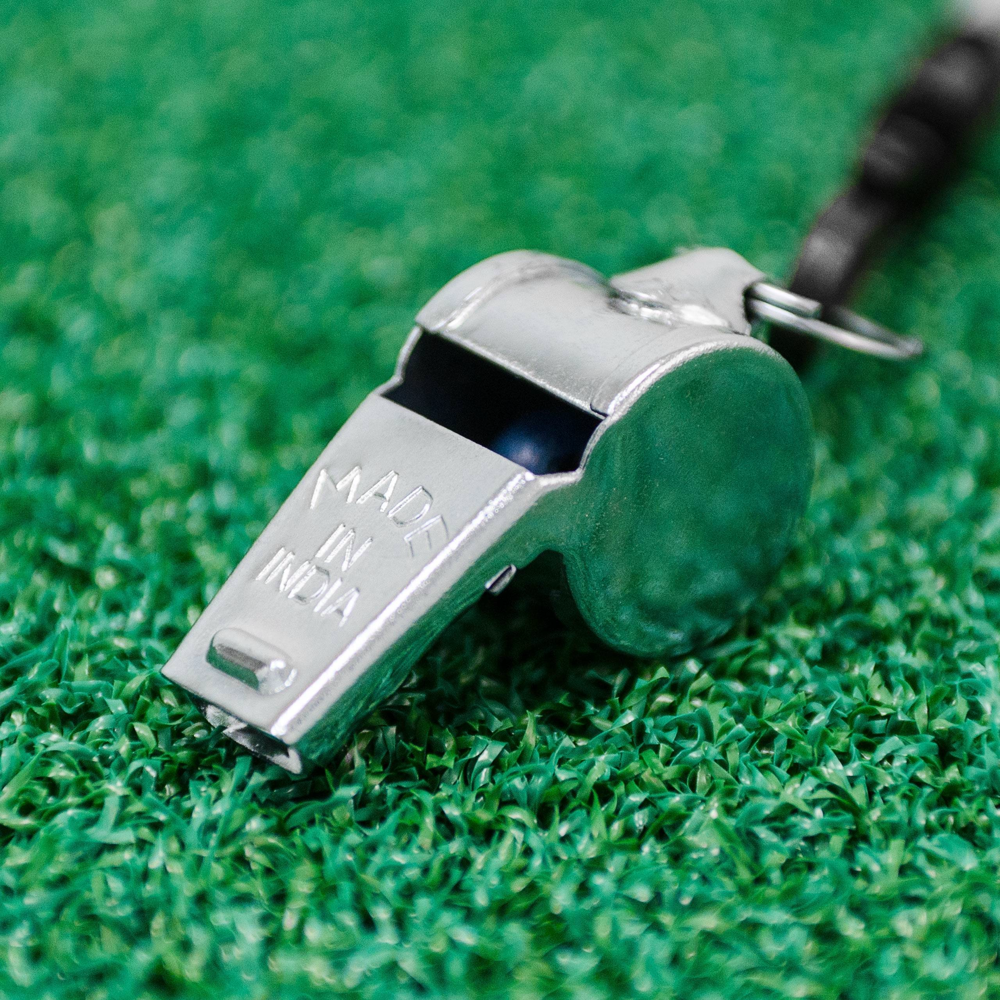

In [9]:
img = cv.imread(cv.samples.findFile("input.jpg"))
input_image = Image.fromarray(img)
display(input_image)

In [10]:
img

array([[[ 26, 156, 103],
        [  3, 133,  80],
        [  0, 124,  71],
        ...,
        [206, 206, 206],
        [206, 206, 206],
        [201, 201, 201]],

       [[ 12, 142,  89],
        [  0, 130,  77],
        [  0, 128,  75],
        ...,
        [202, 202, 202],
        [200, 200, 200],
        [195, 195, 195]],

       [[ 10, 137,  85],
        [ 11, 138,  86],
        [ 12, 139,  87],
        ...,
        [199, 199, 199],
        [198, 198, 198],
        [194, 194, 194]],

       ...,

       [[ 54, 160, 119],
        [ 63, 169, 128],
        [ 75, 179, 138],
        ...,
        [ 11, 108,  51],
        [ 11, 111,  53],
        [ 20, 120,  62]],

       [[ 69, 177, 135],
        [ 76, 182, 141],
        [ 83, 187, 146],
        ...,
        [  7, 105,  45],
        [ 11, 111,  51],
        [ 16, 116,  56]],

       [[ 86, 194, 152],
        [ 83, 191, 149],
        [ 77, 181, 140],
        ...,
        [  6, 104,  44],
        [  5, 105,  45],
        [  2, 102,  42]]

In [11]:
input_buffer = allocate(shape=(2560,2560,3), dtype=np.uint8)
input_buffer[:] = img

In [14]:
transfer(cdma, input_buffer.physical_address, 0x80000000, 1560*2560*3)

Transferring...
Transfered 11980800 bytes from 2016411648 to 2147483648
CDMA Done.


In [15]:
data = []
for i in range(5):
    dat = bram.read(4*i)
    data.append(dat)

data

[57121818, 2080395397, 1418266439, 56266509, 2147504261]

In [25]:
bram.write(0, 0)